# Advanced Lane Finding Project
The goals / steps of this project are the following:

* Compute the camera calibration matrix and distortion coefficients given a set of chessboard images.
* Apply a distortion correction to raw images.
* Use color transforms, gradients, etc., to create a thresholded binary image.
* Apply a perspective transform to rectify binary image ("birds-eye view").
* Detect lane pixels and fit to find the lane boundary.
* Determine the curvature of the lane and vehicle position with respect to center.
* Warp the detected lane boundaries back onto the original image.
* Output visual display of the lane boundaries and numerical estimation of lane curvature and vehicle position.

## Imports

In [6]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import glob
from matplotlib.patches import Polygon
from moviepy.editor import VideoFileClip
from IPython.display import HTML

%matplotlib inline

## Compute the camera calibration using the chessboard images


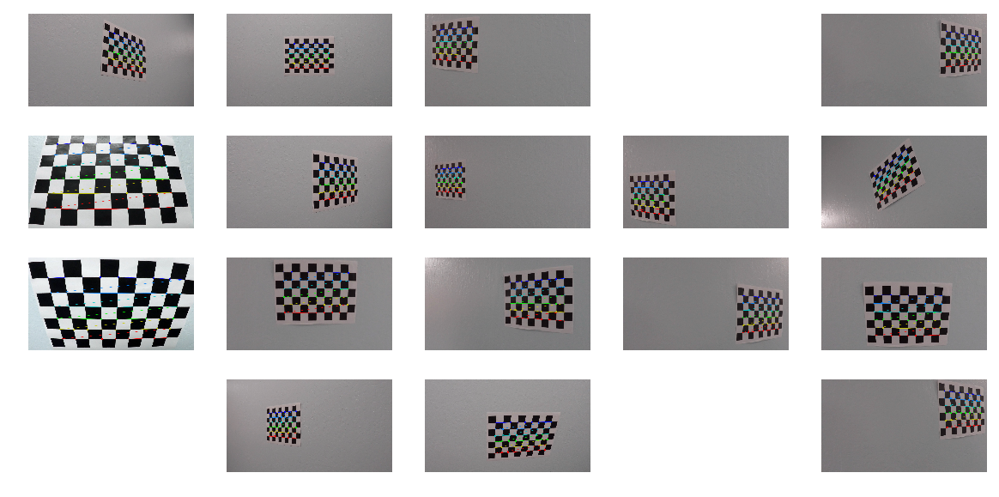

In [7]:
# Variables 
nx = 9  # number of inside corners along x axis
ny = 6  # number of inside corners along y axis
images = glob.glob('./camera_cal/*.jpg') # list of calibration images

# Helper functions 
def calibrate_cam(images, nx, ny):
    """
    Calibrate the camera by finding the Camera Matrix and Distortion Coefficient.
    The sizes of images in path must be the same.
    """
    # Arrays to store object points and image points from all the images.
    objpoints = []  # 3D points in real world space
    imgpoints = []  # 2D points in image plane
    
    # Prepare object points, like (0,0,0), (1,0,0), ..., (nx, ny, 0)
    objp = np.zeros((nx * ny, 3), np.float32)
    objp[:,:2] = np.mgrid[0:nx, 0:ny].T.reshape(-1,2)
    
    # Visualize detected corners
    fig, axes = plt.subplots(4,5, figsize=(20, 10))
    axes = axes.ravel()
    
    for i, fname in enumerate(images): 
        # Read in an image
        img = cv2.imread(fname)
        # Convert to grayscale
        gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
        # Find the chessboard corners
        corners_found, corners = cv2.findChessboardCorners(gray, (nx, ny))
        # Switch off axis in axes
        axes[i].axis('off')
        # If corners are found
        if corners_found:
            # Add object points and image points to the arrays
            objpoints.append(objp)
            imgpoints.append(corners)
            # Draw and display the corners
            img = cv2.drawChessboardCorners(img, (nx, ny), corners, corners_found)
            axes[i].imshow(img)

    # Calibrate the camera using object points and image points from the arrays   
    ret, mtx, dist, rvecs, tvecs = \
        cv2.calibrateCamera(objpoints, imgpoints, img.shape[1::-1], None, None)
    
    # Save results
    plt.savefig("output_images/calibration.png", bbox_inches='tight')
    
    return mtx, dist

# Main 
mtx, dist = calibrate_cam(images, nx, ny)

## Apply Distortion Correction

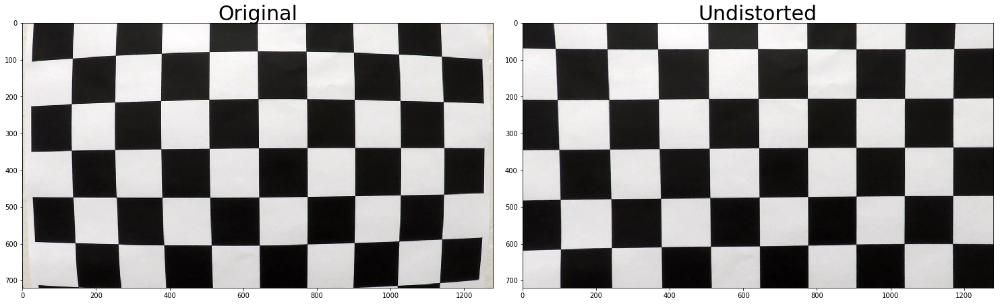

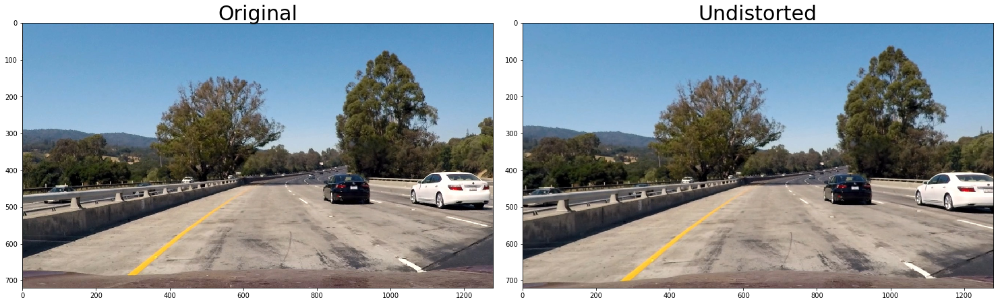

In [8]:
# Variables
chessboard = 'camera_cal/calibration1.jpg'
test = 'test_images/test1.jpg'

# Helper functions
def compare(img1, title1, is_img1_binary, img2, title2, is_img2_binary):
    """
    Visualize two images side-by-side to show the effect of image-processing.
    """
    f, (ax1, ax2) = plt.subplots(1, 2, figsize=(20, 10))
    f.tight_layout()
    if is_img1_binary:
        ax1.imshow(img1, cmap='gray')
    else:
        ax1.imshow(img1)
    ax1.set_title(title1, fontsize=30)
    if is_img2_binary:
        ax2.imshow(img2, cmap='gray')
    else:
        ax2.imshow(img2)
    ax2.set_title(title2, fontsize=30)
    plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)
    
# Main

# Chessboard Image
ori = mpimg.imread(chessboard)
undist = cv2.undistort(ori, mtx, dist)
compare(ori, "Original", False, undist, "Undistorted", False)

# Test Image
ori = mpimg.imread(test)
undist = cv2.undistort(ori, mtx, dist)
compare(ori, "Original", False, undist, "Undistorted", False)

# Save Image
undist_rev = cv2.cvtColor(undist, cv2.COLOR_RGB2BGR)
cv2.imwrite("output_images/undistorted.jpg", undist_rev)
plt.savefig("output_images/undistorted_result.png", bbox_inches='tight')

## Apply Gradient Thresholds
The different types of gradient threholds are as follows:
* Directional Gradient along x axis
* Directional Gradient along y axis
* Magnitude of Gradient
* Direction of Gradient

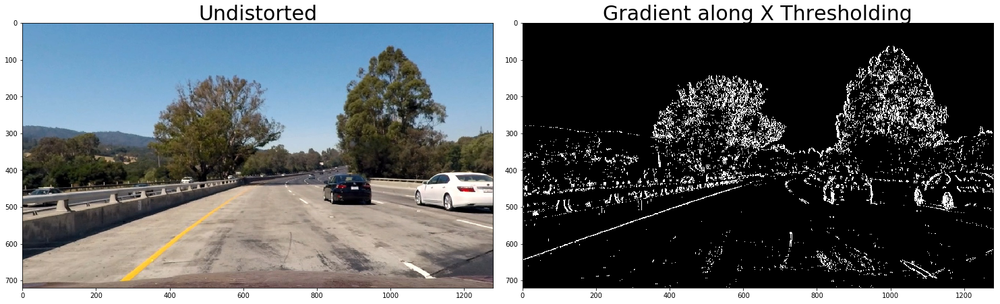

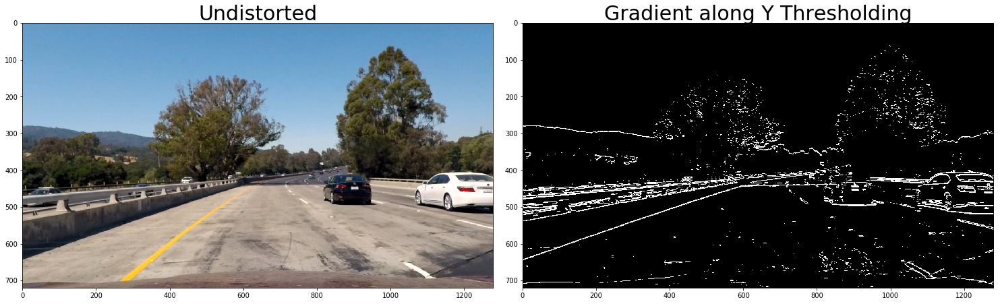

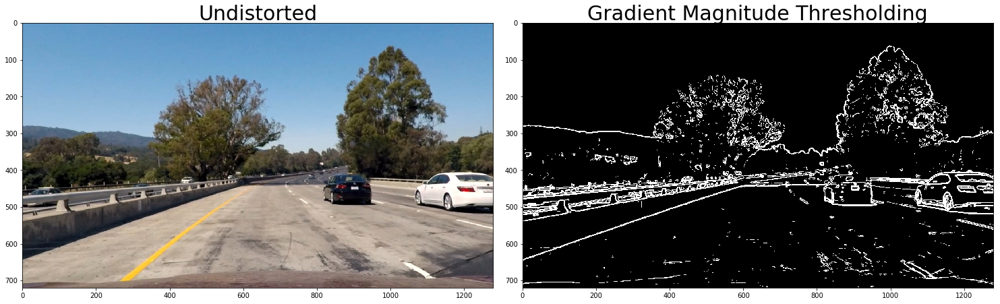

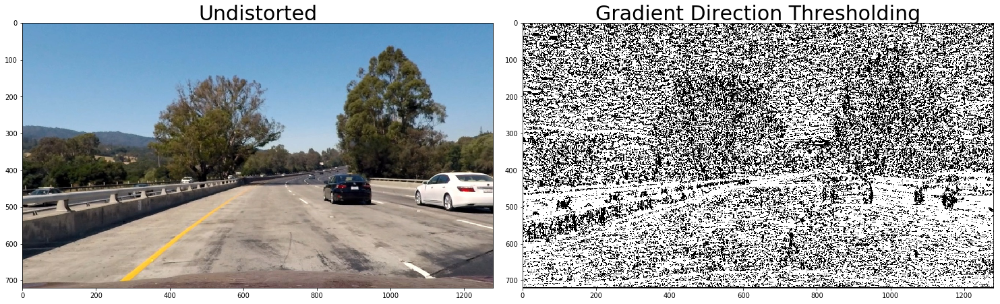

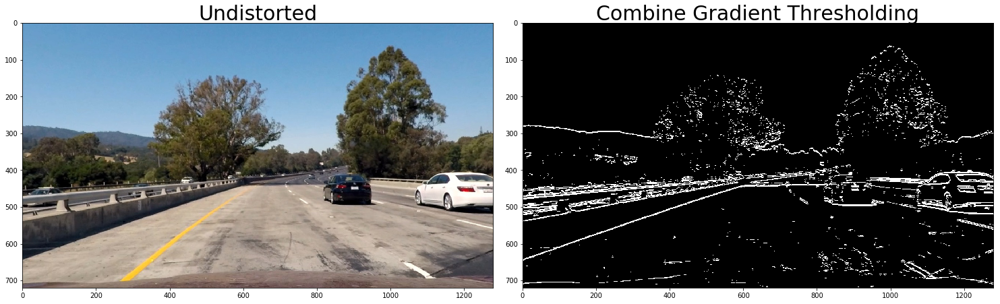

In [9]:
# Variables
img = 'output_images/undistorted.jpg' # test image

# Helper functions
def abs_sobel_thresh(img, orient='x', thresh_min=0, thresh_max=255, sobel_kernel=3):
    """
    Apply directional gradient threshold in x or y direction.
    """
    # Convert to grayscale
    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    # Apply x or y gradient thershold
    if orient == 'x':
        abs_sobel = np.absolute(cv2.Sobel(gray, cv2.CV_64F, 1, 0, sobel_kernel))
    if orient == 'y':
        abs_sobel = np.absolute(cv2.Sobel(gray, cv2.CV_64F, 0, 1, sobel_kernel))
    # Rescale back to 8 bit integer
    scaled_sobel = np.uint8(abs_sobel/np.max(abs_sobel)*255)
    # Create a copy
    binary_output = np.zeros_like(scaled_sobel)
    # Apply the gradient threshold
    binary_output[(scaled_sobel >= thresh_min) & (scaled_sobel <= thresh_max)] = 1
    # Return the result
    return binary_output

def mag_thresh(img, thresh=(0, 255), sobel_kernel=3):
    """
    Apply magnitude-of-gradient thresholding.
    """
    # Convert to grayscale
    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    # Take both Sobel x and y gradients
    sobelx = cv2.Sobel(gray, cv2.CV_64F, 1, 0, ksize=sobel_kernel)
    sobely = cv2.Sobel(gray, cv2.CV_64F, 0, 1, ksize=sobel_kernel)
    # Calculate the gradient magnitude
    gradmag = np.sqrt(sobelx**2 + sobely**2)
    # Rescale to 8 bit
    scale_factor = np.max(gradmag)/255 
    gradmag = (gradmag/scale_factor).astype(np.uint8) 
    # Create a binary image of ones where threshold is met, zeros otherwise
    binary_output = np.zeros_like(gradmag)
    binary_output[(gradmag >= thresh[0]) & (gradmag <= thresh[1])] = 1
    # Return the binary image
    return binary_output

def dir_thresh(img, thresh=(0, np.pi/2), sobel_kernel=3):
    """
    Apply direction-of-gradient thresholding.
    """
    # Grayscale
    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    # Calculate the x and y gradients
    sobelx = cv2.Sobel(gray, cv2.CV_64F, 1, 0, ksize=sobel_kernel)
    sobely = cv2.Sobel(gray, cv2.CV_64F, 0, 1, ksize=sobel_kernel)
    # Take the absolute value of the gradient direction, 
    # apply a threshold, and create a binary image result
    absgraddir = np.arctan2(np.absolute(sobely), np.absolute(sobelx))
    binary_output =  np.zeros_like(absgraddir)
    binary_output[(absgraddir >= thresh[0]) & (absgraddir <= thresh[1])] = 1
    # Return the binary image
    return binary_output

# Main

# Read in an image
ori = mpimg.imread(img)

# Apply directional gradient thresholding along x direction
grad_x = abs_sobel_thresh(ori, 'x', 20, 255, 5)
compare(ori, "Undistorted", False, grad_x, "Gradient along X Thresholding", True)

# Apply directional gradient thresholding along y direction
grad_y = abs_sobel_thresh(ori, 'y', 40, 255, 5)
compare(ori, "Undistorted", False, grad_y, "Gradient along Y Thresholding", True)

# Apply magnitude-of-gradient thresholding
grad_mag = mag_thresh(ori, (40, 255), 5)
compare(ori, "Undistorted", False, grad_mag, "Gradient Magnitude Thresholding", True)

# Apply direction-of-gradient thresholding
grad_dir = dir_thresh(ori, (np.pi/4, np.pi/2), 5)
compare(ori, "Undistorted", False, grad_dir, "Gradient Direction Thresholding", True)

# Apply combine thresholding
grad_comb = np.zeros_like(grad_dir)
grad_comb[((grad_x == 1) & (grad_y == 1)) | ((grad_mag == 1) & (grad_dir == 1))] = 1
compare(ori, "Undistorted", False, grad_comb, "Combine Gradient Thresholding", True)

# Save results
plt.savefig("output_images/gradient_threshold.png", bbox_inches='tight')

## Apply S Channel (HLS) Color Threshold

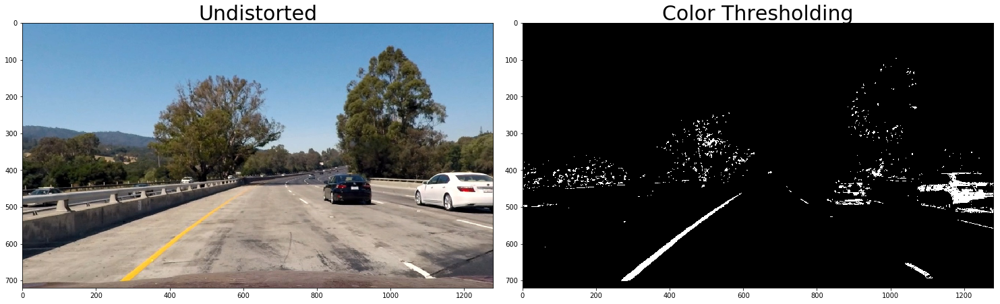

In [10]:
# Variables
img = 'output_images/undistorted.jpg' # test image

# Helper functions
def hls_select(img, s_thresh=(0, 255)):
    """
    Thresholds the S-channel of HLS
    """
    # Convert to HLS color space
    hls = cv2.cvtColor(img, cv2.COLOR_RGB2HLS)
    s_channel = hls[:,:,2]
    # Apply a threshold to the S channel
    binary_output = np.zeros_like(s_channel)
    binary_output[(s_channel > s_thresh[0]) & (s_channel <= s_thresh[1])] = 1
    return binary_output

# Main
# Read in an image
ori = mpimg.imread(img)
# Apply Color Threshold
color = hls_select(ori, (150, 255))
compare(ori, "Undistorted", False, color, "Color Thresholding", True)
# Save results
plt.savefig("output_images/color_threshold.png", bbox_inches='tight')

# Combine Gradient and Color Threshold

True

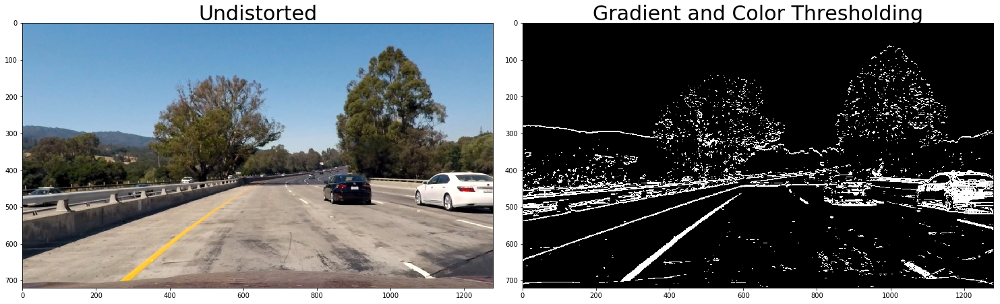

In [11]:
# Variables
img = 'output_images/undistorted.jpg' # test image

# Helper functions
def pipeline(img, \
             x_thresh_min, \
             x_thresh_max, \
             y_thresh_min, \
             y_thresh_max, \
             mag_threshold, \
             dir_threshold, \
             sobel_kernel, \
             s_thresh):
    # Gradient threshold
    grad_x = abs_sobel_thresh(img, 'x', x_thresh_min, x_thresh_max, sobel_kernel)
    grad_y = abs_sobel_thresh(img, 'y', y_thresh_min, y_thresh_max, sobel_kernel)
    grad_mag = mag_thresh(img, mag_threshold, sobel_kernel)
    grad_dir = dir_thresh(img, dir_threshold, sobel_kernel)
    grad_comb = np.zeros_like(grad_dir)
    grad_comb[((grad_x == 1) & (grad_y == 1)) | ((grad_mag == 1) & (grad_dir == 1))] = 1
    
    # Color threshold
    color = hls_select(img, s_thresh)
    
    # Combine threshold
    combined = np.zeros_like(grad_dir)
    combined[(grad_comb == 1) | (color == 1)] = 1       
    # Convert to HLS color space and separate the V channel
    return combined
    
# Main
# Read in an image
ori = mpimg.imread(img)
# Apply Color Threshold
combined = pipeline(ori, \
                    20, \
                    255, \
                    40, \
                    255, \
                    (40,255), \
                    (np.pi/4, np.pi/2), \
                    5, \
                    (150,255))
compare(ori, "Undistorted", False, combined, "Gradient and Color Thresholding", True)
# Save results
plt.savefig("output_images/combine_threshold.png", bbox_inches='tight')
combined_altered = (combined * 255).astype(np.uint8)
cv2.imwrite("output_images/undistorted_threshold.jpg", combined_altered)

## Obtain Perspective Transform

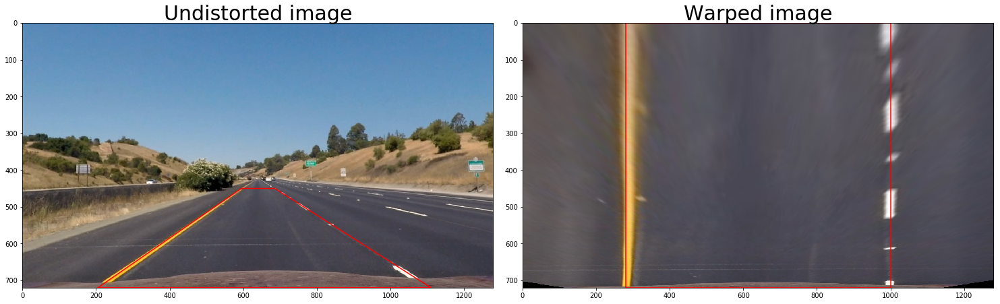

In [12]:
# Variables
img = 'test_images/straight_lines1.jpg' # test image
src_coord = np.float32([[205, 720], 
                        [595, 450], 
                        [685, 450], 
                        [1110, 720]])

dst_coord = np.float32([[280, 720], 
                        [280, 0], 
                        [1000, 0], 
                        [1000, 720]])

# Helper functions
def transform_img(img, src_coord, dst_coord):
    """
    Transform the image according to the source and destination points.
    Also plot the source and destination boundaries.
    """
    # Grab the image shape
    img_size = (img.shape[1], img.shape[0])
    # Given src and dst points, calculate the perspective transform matrix
    M = cv2.getPerspectiveTransform(src_coord, dst_coord)
    Minv = cv2.getPerspectiveTransform(dst_coord, src_coord)
    # Warp the image
    warped = cv2.warpPerspective(img, M, img_size, flags=cv2.INTER_LINEAR)
    
    # Visualize results
    f, (ax1, ax2) = plt.subplots(1, 2, figsize=(20,10))
    f.tight_layout()
    ax1.set_title('Undistorted image', fontsize=30)
    ax1.imshow(img)
    ax1.plot(Polygon(src_coord).get_xy()[:, 0], Polygon(src_coord).get_xy()[:, 1], color='red')
    ax2.set_title('Warped image', fontsize=30)
    ax2.imshow(warped)
    ax2.plot(Polygon(dst_coord).get_xy()[:, 0], Polygon(dst_coord).get_xy()[:, 1], color='red')
    plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)

    # Return the resulting image and matrix
    return warped, M, Minv

# Main
ori = mpimg.imread(img)
undist = cv2.undistort(ori, mtx, dist)
warped, M, Minv = transform_img(undist, src_coord, dst_coord)
# Save results
plt.savefig("output_images/perspective_transform.png", bbox_inches='tight')

## Apply Perspective Transform

True

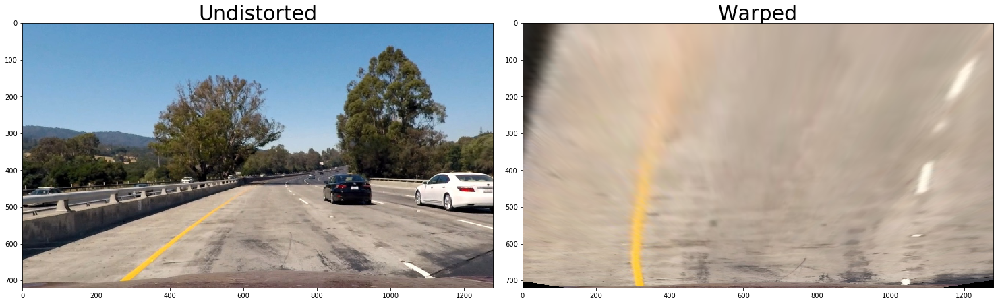

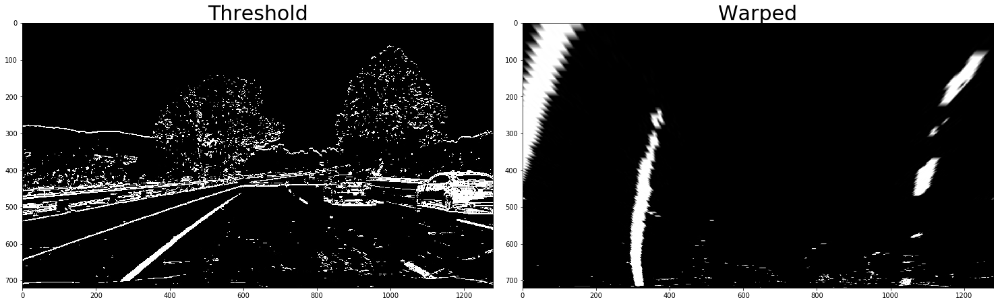

In [13]:
# Variables
img = "output_images/undistorted.jpg"
binary = "output_images/undistorted_threshold.jpg"

# Main
# RGB
ori = plt.imread(img)
warped = cv2.warpPerspective(ori, M, ori.shape[1::-1], flags=cv2.INTER_LINEAR)
compare(ori, "Undistorted", False, warped, "Warped", False)
# Save results
plt.savefig("output_images/warped_result.png", bbox_inches='tight')
warped_rev = cv2.cvtColor(warped, cv2.COLOR_RGB2BGR)
cv2.imwrite("output_images/undistorted_threshold_warped_color.jpg", warped_rev)

# Binary
ori = plt.imread(binary)/255
warped = cv2.warpPerspective(ori, M, ori.shape[1::-1], flags=cv2.INTER_LINEAR)
compare(ori, "Threshold", True, warped, "Warped", True)
# Save results
warped_altered = (warped * 255).astype(np.uint8)
cv2.imwrite("output_images/undistorted_threshold_warped.jpg", warped_altered)

## Determine lane beginning using histogram

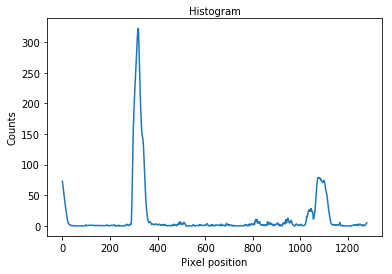

In [14]:
# Variables
img = "output_images/undistorted_threshold_warped.jpg"

# Helper functions
def get_histogram(img):
    # Grab only the bottom half of the image
    # Lane lines are likely to be mostly vertical nearest to the car
    bottom_half = img[img.shape[0]//2:,:]

    # Sum across image pixels vertically - make sure to set an `axis`
    # i.e. the highest areas of vertical lines should be larger values
    histogram = np.sum(bottom_half, axis=0)
    
    return histogram

# Main
# Read in the image
test = plt.imread(img)/255
# Create histogram of image binary activations
histogram = get_histogram(test)
# Visualize the resulting histogram
plt.title('Histogram', fontsize=10)
plt.xlabel('Pixel position')
plt.ylabel('Counts')
plt.plot(histogram)

## Fit Polynomial using Sliding Window

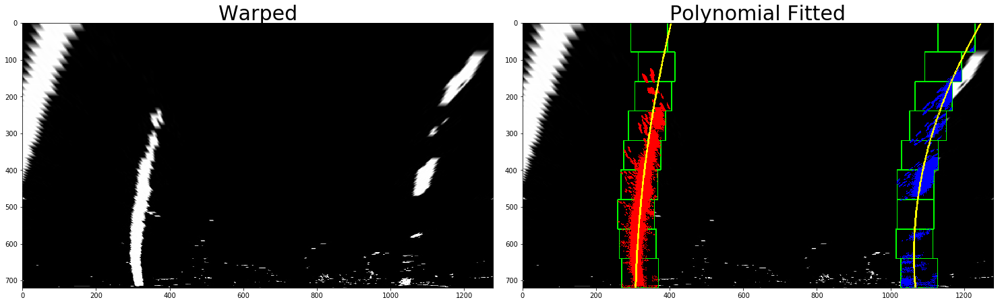

In [15]:
# Variables
img = "output_images/undistorted_threshold_warped.jpg"

# Helper Functions
def find_lane_pixels(binary_warped):
    """
    Find lane pixels using sliding window method.
    """
    # Take a histogram of the bottom half of the image
    histogram = get_histogram(binary_warped)
    # Create an output image to draw on and visualize the result
    out_img = np.dstack((binary_warped, binary_warped, binary_warped))
    # Find the peak of the left and right halves of the histogram
    # These will be the starting point for the left and right lines
    midpoint = np.int(histogram.shape[0]//2)
    leftx_base = np.argmax(histogram[:midpoint])
    rightx_base = np.argmax(histogram[midpoint:]) + midpoint

    # HYPERPARAMETERS
    # Choose the number of sliding windows
    nwindows = 9
    # Set the width of the windows +/- margin
    margin = 50
    # Set minimum number of pixels found to recenter window
    minpix = 50

    # Set height of windows - based on nwindows above and image shape
    window_height = np.int(binary_warped.shape[0]//nwindows)
    # Identify the x and y positions of all nonzero pixels in the image
    nonzero = binary_warped.nonzero()
    nonzeroy = np.array(nonzero[0])
    nonzerox = np.array(nonzero[1])
    # Current positions to be updated later for each window in nwindows
    leftx_current = leftx_base
    rightx_current = rightx_base

    # Create empty lists to receive left and right lane pixel indices
    left_lane_inds = []
    right_lane_inds = []

    # Step through the windows one by one
    for window in range(nwindows):
        # Identify window boundaries in x and y (and right and left)
        win_y_low = binary_warped.shape[0] - (window+1)*window_height
        win_y_high = binary_warped.shape[0] - window*window_height
        win_xleft_low = leftx_current - margin
        win_xleft_high = leftx_current + margin
        win_xright_low = rightx_current - margin
        win_xright_high = rightx_current + margin
        
        # Draw the windows on the visualization image
        cv2.rectangle(out_img,(win_xleft_low,win_y_low),
        (win_xleft_high,win_y_high),(0,255,0), 2) 
        cv2.rectangle(out_img,(win_xright_low,win_y_low),
        (win_xright_high,win_y_high),(0,255,0), 2) 
        
        # Identify the nonzero pixels in x and y within the window
        good_left_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & 
        (nonzerox >= win_xleft_low) &  (nonzerox < win_xleft_high)).nonzero()[0]
        good_right_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & 
        (nonzerox >= win_xright_low) &  (nonzerox < win_xright_high)).nonzero()[0]
        
        # Append these indices to the lists
        left_lane_inds.append(good_left_inds)
        right_lane_inds.append(good_right_inds)
        
        # If you found > minpix pixels, recenter next window on their mean position
        if len(good_left_inds) > minpix:
            leftx_current = np.int(np.mean(nonzerox[good_left_inds]))
        if len(good_right_inds) > minpix:        
            rightx_current = np.int(np.mean(nonzerox[good_right_inds]))

    # Concatenate the arrays of indices (previously was a list of lists of pixels)
    try:
        left_lane_inds = np.concatenate(left_lane_inds)
        right_lane_inds = np.concatenate(right_lane_inds)
    except ValueError:
        # Avoids an error if the above is not implemented fully
        pass

    # Extract left and right line pixel positions
    leftx = nonzerox[left_lane_inds]
    lefty = nonzeroy[left_lane_inds] 
    rightx = nonzerox[right_lane_inds]
    righty = nonzeroy[right_lane_inds]

    return leftx, lefty, rightx, righty, out_img

def fit_polynomial(binary_warped):
    """
    Find lane lines.
    """
    # Find our lane pixels first
    leftx, lefty, rightx, righty, out_img = find_lane_pixels(binary_warped)

    # Fit a second order polynomial to each using `np.polyfit`
    left_fit = np.polyfit(lefty, leftx, 2)
    right_fit = np.polyfit(righty, rightx, 2)

    # Generate x and y values for plotting
    ploty = np.linspace(0, binary_warped.shape[0]-1, binary_warped.shape[0] )
    try:
        left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
        right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]
    except TypeError:
        # Avoids an error if `left` and `right_fit` are still none or incorrect
        print('The function failed to fit a line!')
        left_fitx = 1*ploty**2 + 1*ploty
        right_fitx = 1*ploty**2 + 1*ploty

    ## Visualization ##
    # Colors in the left and right lane regions
    out_img[lefty, leftx] = [255, 0, 0]
    out_img[righty, rightx] = [0, 0, 255]

    # Plots the left and right polynomials on the lane lines
    #plt.plot(left_fitx, ploty, color='yellow')
    #plt.plot(right_fitx, ploty, color='yellow')
    # Draw left and right lines
    for index in range(out_img.shape[0]):
        cv2.circle(out_img, (int(left_fitx[index]), int(ploty[index])), 2, (255,255,0))
        cv2.circle(out_img, (int(right_fitx[index]), int(ploty[index])), 2, (255,255,0))
            
    return out_img, left_fit, right_fit, leftx[-1], rightx[-1]

# Main
# Read in the image
test = plt.imread(img) # Note that we do not convert img into binary image
fitted, left_fit, right_fit, leftx_btm, rightx_btm = fit_polynomial(test)
compare(test, "Warped", True, fitted, "Polynomial Fitted", True)
# Save results
plt.savefig("output_images/fitted.png", bbox_inches='tight')

## Fit Polynomial by Search from Prior

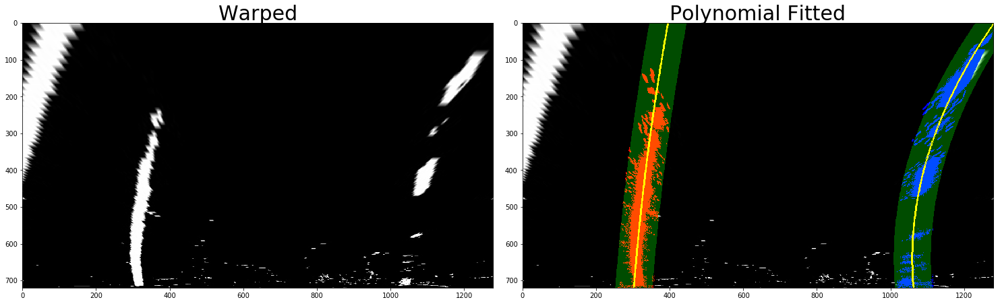

In [16]:
# variables
img = "output_images/undistorted_threshold_warped.jpg"

# helper functions
def fit_poly(leftx, lefty, rightx, righty):
    """
    Fit a second degree polynomial given points.
    Return second degree polynomial coefficients.
    """
     ### TO-DO: Fit a second order polynomial to each with np.polyfit() ###
    left_fit = np.polyfit(lefty, leftx, 2)
    right_fit = np.polyfit(righty, rightx, 2)
    # Generate x and y values for plotting
    #ploty = np.linspace(0, img_shape[0]-1, img_shape[0])
    ### TO-DO: Calc both polynomials using ploty, left_fit and right_fit ###
    #left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
    #right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]
    
    return left_fit, right_fit

def search_around_polynomial(binary_warped, left_fit, right_fit):
    """
    Search around prior lane lines for new lane lines.
    """
    # HYPERPARAMETER
    # Choose the width of the margin around the previous polynomial to search
    # The quiz grader expects 100 here, but feel free to tune on your own!
    margin = 50

    # Grab activated pixels
    nonzero = binary_warped.nonzero()
    nonzeroy = np.array(nonzero[0])
    nonzerox = np.array(nonzero[1])
    
    ### TO-DO: Set the area of search based on activated x-values ###
    ### within the +/- margin of our polynomial function ###
    ### Hint: consider the window areas for the similarly named variables ###
    ### in the previous quiz, but change the windows to our new search area ###
    left_lane_inds = ((nonzerox > (left_fit[0]*(nonzeroy**2) + left_fit[1]*nonzeroy + 
                    left_fit[2] - margin)) & (nonzerox < (left_fit[0]*(nonzeroy**2) + 
                    left_fit[1]*nonzeroy + left_fit[2] + margin)))
    right_lane_inds = ((nonzerox > (right_fit[0]*(nonzeroy**2) + right_fit[1]*nonzeroy + 
                    right_fit[2] - margin)) & (nonzerox < (right_fit[0]*(nonzeroy**2) + 
                    right_fit[1]*nonzeroy + right_fit[2] + margin)))
    
    # Again, extract left and right line pixel positions
    leftx = nonzerox[left_lane_inds]
    lefty = nonzeroy[left_lane_inds] 
    rightx = nonzerox[right_lane_inds]
    righty = nonzeroy[right_lane_inds]

    # Fit new polynomials
    left_fit, right_fit = fit_poly(leftx, lefty, rightx, righty)

    ## Visualization ##
    # Create an image to draw on and an image to show the selection window
    out_img = np.dstack((binary_warped, binary_warped, binary_warped))
    window_img = np.zeros_like(out_img)
    # Color in left and right line pixels
    out_img[lefty, leftx] = [255, 0, 0]
    out_img[righty, rightx] = [0, 0, 255]

    # Generate a polygon to illustrate the search window area
    # And recast the x and y points into usable format for cv2.fillPoly()
    ploty = np.linspace(0, window_img.shape[0]-1, window_img.shape[0])
    left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
    right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]
    left_line_window1 = np.array([np.transpose(np.vstack([left_fitx-margin, ploty]))])
    left_line_window2 = np.array([np.flipud(np.transpose(np.vstack([left_fitx+margin, 
                              ploty])))])
    left_line_pts = np.hstack((left_line_window1, left_line_window2))
    right_line_window1 = np.array([np.transpose(np.vstack([right_fitx-margin, ploty]))])
    right_line_window2 = np.array([np.flipud(np.transpose(np.vstack([right_fitx+margin, 
                              ploty])))])
    right_line_pts = np.hstack((right_line_window1, right_line_window2))

    # Draw the lane onto the warped blank image
    cv2.fillPoly(window_img, np.int_([left_line_pts]), (0,255, 0))
    cv2.fillPoly(window_img, np.int_([right_line_pts]), (0,255, 0))
    result = cv2.addWeighted(out_img, 1, window_img, 0.3, 0)
    
    # Plot the polynomial lines onto the image
    #plt.plot(left_fitx, ploty, color='yellow')
    #plt.plot(right_fitx, ploty, color='yellow')
    for index in range(result.shape[0]):
        cv2.circle(result, (int(left_fitx[index]), int(ploty[index])), 2, (255,255,0))
        cv2.circle(result, (int(right_fitx[index]), int(ploty[index])), 2, (255,255,0))
            
    return result, left_fit, right_fit, leftx[-1], rightx[-1]

# main
test = plt.imread(img) # Note that we do not convert img into binary image
fitted, left_fit, right_fit, leftx_btm, rightx_btm = search_around_polynomial(test, left_fit, right_fit)
compare(test, "Warped", True, fitted, "Polynomial Fitted", True)
# Save results
plt.savefig("output_images/searched.png", bbox_inches='tight')

## Determine the curvature of the lane

In [17]:
# helper functions
def measure_curvature_pixels(img, left_fit, right_fit):
    """
    Calculates the curvature of lane lines in pixels.
    """
    # Define conversions in x and y from pixels space to meters
    ym_per_pix = 30/720 # meters per pixel in y dimension
    xm_per_pix = 3.7/700 # meters per pixel in x dimension
    
    # Define y-value where we want radius of curvature
    # We'll choose the maximum y-value, corresponding to the bottom of the image
    y_eval = np.max(img.shape[0])
    
    # Convert fitting coefficient from pixels space to meters
    left_fit_cr = [left_fit[0] * xm_per_pix / ym_per_pix**2,
                   left_fit[1] * xm_per_pix / ym_per_pix,
                   left_fit[2] * xm_per_pix]
    right_fit_cr = [right_fit[0] * xm_per_pix / ym_per_pix**2,
                    right_fit[1] * xm_per_pix / ym_per_pix,
                    right_fit[2] * xm_per_pix]
    
    # Calculation of R_curve (radius of curvature)
    left_curverad = ((1 + (2*left_fit_cr[0]*y_eval*ym_per_pix + left_fit_cr[1])**2)**1.5) / \
                     np.absolute(2*left_fit_cr[0])
    right_curverad = ((1 + (2*right_fit_cr[0]*y_eval*ym_per_pix + right_fit_cr[1])**2)**1.5) / \
                      np.absolute(2*right_fit_cr[0])
    
    return left_curverad, right_curverad

# main
left_curverad, right_curverad = measure_curvature_pixels(fitted, left_fit, right_fit)
print('Left line curvature:', round(left_curverad, 2), 'm')
print('Right line curvature:', round(right_curverad, 2), 'm')

Left line curvature: 2319.9 m
Right line curvature: 301.66 m


## Determine the car offset from the center

In [18]:
# helper function
def car_offset(img, leftx_btm, rightx_btm):
    """
    Determine car offset from the center of the lanes.
    Offset is positive when car is towards left.
    """
    # Conversion from pixels to meters
    xm_per_pix=3.7/700
    # Determine center of car
    car_center = img.shape[1]//2     
    # Determine the center of lane
    lane_center = (leftx_btm + rightx_btm)//2
    # Determine car offset from the lane -> left is positive
    offsetx = (lane_center - car_center) * xm_per_pix
    return offsetx

# Main
offsetx = car_offset(fitted, leftx_btm, rightx_btm)
print ('Car offset from center:', round(offsetx, 2), 'm.')

Car offset from center: 0.49 m.


## Annotate the original image

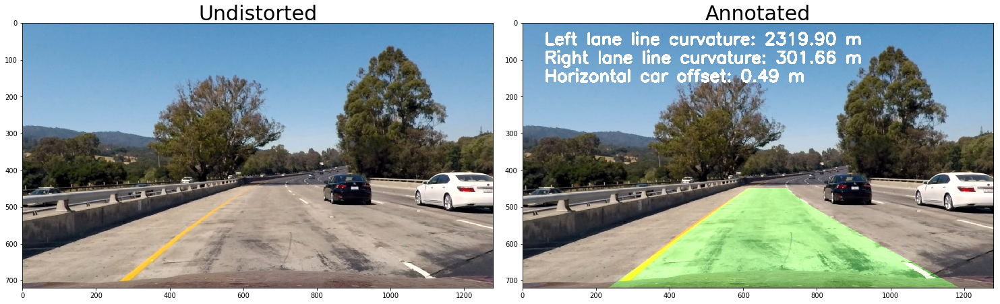

In [19]:
# Variables
undist_img = "output_images/undistorted.jpg"

# helper function
def draw_lanes(undist, Minv, left_fit, right_fit):
    """
    Draw lane lines on the image.
    """
    # Determine the lane line
    ploty = np.linspace(0, undist.shape[0]-1, undist.shape[0])
    left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
    right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]
    
    # Create an image to draw the lines on
    color_warp = np.zeros_like(undist).astype(np.uint8)

    # Recast the x and y points into usable format for cv2.fillPoly()
    pts_left = np.array([np.transpose(np.vstack([left_fitx, ploty]))])
    pts_right = np.array([np.flipud(np.transpose(np.vstack([right_fitx, ploty])))])
    pts = np.hstack((pts_left, pts_right))

    # Draw the lane onto the warped blank image
    cv2.fillPoly(color_warp, np.int_([pts]), (0,255, 0))

    # Warp the blank back to original image space using inverse perspective matrix (Minv)
    newwarp = cv2.warpPerspective(color_warp, Minv, color_warp.shape[1::-1], flags=cv2.INTER_LINEAR) 
    # Combine the result with the original image
    result = cv2.addWeighted(undist, 1, newwarp, 0.3, 0)
    
    return result

def add_metrics(img, left_curverad, right_curverad, offsetx):  
    """
    Add metrics onto the image.
    """
    # Display lane curvature
    out_img = img.copy()
    cv2.putText(out_img, 'Left lane line curvature: {:.2f} m'.format(left_curverad), 
                (60, 60), cv2.FONT_HERSHEY_SIMPLEX, 1.5, (255,255,255), 5)
    cv2.putText(out_img, 'Right lane line curvature: {:.2f} m'.format(right_curverad), 
                (60, 110), cv2.FONT_HERSHEY_SIMPLEX, 1.5, (255,255,255), 5)
    
    # Display car offset
    cv2.putText(out_img, 'Horizontal car offset: {:.2f} m'.format(offsetx), 
                (60, 160), cv2.FONT_HERSHEY_SIMPLEX, 1.5, (255,255,255), 5)
    
    return out_img

# main
undist = plt.imread(undist_img)
result = draw_lanes(undist, Minv, left_fit, right_fit)
result = add_metrics(result, left_curverad, right_curverad, offsetx)
compare(undist, "Undistorted", False, result, "Annotated", False)
# Save results
plt.savefig("output_images/annotated.png", bbox_inches='tight')

## Run the pipeline in a video

t:   0%|          | 0/1260 [00:00<?, ?it/s, now=None]

Moviepy - Building video ./project_video_processed.mp4.
Moviepy - Writing video ./project_video_processed.mp4



Moviepy - Done !
Moviepy - video ready ./project_video_processed.mp4
CPU times: user 3min 19s, sys: 4.27 s, total: 3min 23s
Wall time: 3min 23s


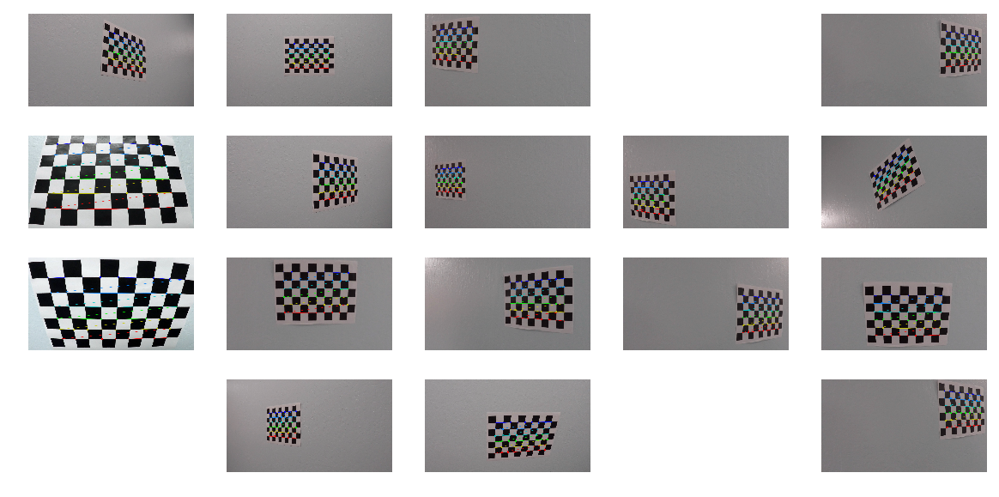

In [20]:
# variables
input_video = './project_video.mp4'
output_video = './project_video_processed.mp4'
calibration_images = glob.glob('./camera_cal/*.jpg') # list of calibration images
nx = 9  # number of inside corners along x axis
ny = 6  # number of inside corners along y axis
src_coord = np.float32([[205, 720], 
                        [595, 450], 
                        [685, 450], 
                        [1110, 720]])
dst_coord = np.float32([[280, 720], 
                        [280, 0], 
                        [1000, 0], 
                        [1000, 720]])

# helper class
class Line:
    
    def __init__(self, num_average_):
        self.num_average = num_average_
        self.detected = False  
        self.fit_list = []
        self.x_btm_list = []
        
    def is_detected(self):
        """
        Return whether lane line is detected or not.
        """
        return self.detected
    
    def check_detected(self):
        """
        Check whether lane line is detected or not.
        """
        if (len(self.fit_list) > 0 and len(self.x_btm_list) > 0):
            self.detected = True
        else:
            self.detected = False
    
    def add_fit(self, fit, x_btm):
        """
        Append polynomial coefficients and bottom x pixel of the line
        to the averaging list.
        """
        self.fit_list.append(fit)
        if (len(self.fit_list) > self.num_average):
            self.fit_list.pop(0)
        
        self.x_btm_list.append(x_btm)
        if (len(self.x_btm_list) > self.num_average):
            self.x_btm_list.pop(0)
            
        self.check_detected()
    
    def return_average(self):
        
        average_fit = [0, 0, 0]
        for coefficient_index in range(3):
            for fit_array in self.fit_list:
                average_fit[coefficient_index] += fit_array[coefficient_index]

        average_fit = np.array(average_fit) / len(self.fit_list)
        average_x_btm = int(sum(self.x_btm_list) / len(self.x_btm_list))
        
        return average_fit, average_x_btm
        
class ProcessImage:
    
    def __init__(self):
        self.mtx = None
        self.dist = None
        self.M = None
        self.Minv = None
        self.left_line = Line(10)
        self.right_line = Line(10)
        
    def calibrate(self, images, nx, ny):
        """
        Obtain camera matrix and distortion coefficients
        """
        self.mtx, self.dist = calibrate_cam(images, nx, ny)
        
    def transform(self, src_coord, dst_coord):
        """
        Obtain perspective transform matrix.
        """
        self.M = cv2.getPerspectiveTransform(src_coord, dst_coord)
        self.Minv = cv2.getPerspectiveTransform(dst_coord, src_coord)
    
    def __call__(self, ori):
        """
        Video processing pipeline.
        """
        # Undistort the image
        undist = cv2.undistort(ori, mtx, dist)
        # Apply gradient and color thresholding
        combined = pipeline(undist, 20, 255, 40, 255, (40, 255), (np.pi/4, np.pi/2), 5, (150,255))
        # Apply warping
        warped_binary = cv2.warpPerspective(combined, M, combined.shape[1::-1], flags=cv2.INTER_LINEAR)
        if (self.left_line.is_detected() and self.right_line.is_detected()):
            # Retrieve previous value
            left_fit, leftx_btm = self.left_line.return_average()
            right_fit, rightx_btm = self.right_line.return_average()
            # Fit polynomial lines using search from prior
            fitted, left_fit, right_fit, leftx_btm, rightx_btm = \
                search_around_polynomial((warped_binary * 255).astype(np.uint8), left_fit, right_fit)
            # Add to moving average filter
            self.left_line.add_fit(left_fit, leftx_btm)
            self.right_line.add_fit(right_fit, rightx_btm)
        else:
            # Fit polynomial lines using sliding window
            fitted, left_fit, right_fit, leftx_btm, rightx_btm = \
                fit_polynomial((warped_binary * 255).astype(np.uint8))
            # Add to moving average filter
            self.left_line.add_fit(left_fit, leftx_btm)
            self.right_line.add_fit(right_fit, rightx_btm)
        # Retrieve averaged value
        left_fit, leftx_btm = self.left_line.return_average()
        right_fit, rightx_btm = self.right_line.return_average()
        # Determine curvature
        left_curverad, right_curverad = measure_curvature_pixels(fitted, left_fit, right_fit)
        # Determine car offset
        offsetx = car_offset(fitted, leftx_btm, rightx_btm)
        # Annotate image
        drawn = draw_lanes(undist, Minv, left_fit, right_fit)
        annotated = add_metrics(drawn, left_curverad, right_curverad, offsetx)

        return annotated
        
# main
# initialize pipeline
process_image = ProcessImage()
process_image.calibrate(calibration_images, nx, ny)
process_image.transform(src_coord, dst_coord)
# process video frames
clip = VideoFileClip(input_video)
processed_clip = clip.fl_image(process_image)
%time processed_clip.write_videofile(output_video, audio=False)

In [21]:
HTML("""
<video width="960" height="540" controls>
  <source src="{0}">
</video>
""".format(output_video))